<a href="https://colab.research.google.com/github/vthiru300/art_classifier/blob/main/debug_painting_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 719 kB 24.7 MB/s 
     |████████████████████████████████| 197 kB 62.5 MB/s 
     |████████████████████████████████| 1.2 MB 59.0 MB/s 
     |████████████████████████████████| 59 kB 9.5 MB/s 
Mounted at /content/gdrive


In [3]:
from fastai.vision.all import *
#hide
from fastbook import *
from fastai.vision.widgets import *
path = untar_data(URLs.PETS)
dls = ImageDataLoaders.from_name_re(path, get_image_files(path/'images'), pat='(.+)_\d+.jpg', item_tfms=Resize(460), batch_tfms=aug_transforms(size=224, min_scale=0.75))
learn = vision_learner(dls, models.resnet50, metrics=accuracy)
learn.fine_tune(1)
learn.path = Path('.')
learn.export()

epoch,train_loss,valid_loss,accuracy,time
0,0.928964,0.362044,0.893099,01:25


epoch,train_loss,valid_loss,accuracy,time
0,0.403920,0.241122,0.920162,01:47


In [4]:
learn = load_learner('export.pkl')

In [5]:
!cp ./export.pkl ./gdrive/MyDrive/fastai/

In [6]:
labels = learn.dls.vocab
def predict(img):
    img = PILImage.create(img)
    pred,pred_idx,probs = learn.predict(img)
    return {labels[i]: float(probs[i]) for i in range(len(labels))}

In [7]:
!pip install gradio

     |████████████████████████████████| 5.6 MB 24.5 MB/s 
     |████████████████████████████████| 253 kB 68.0 MB/s 
     |████████████████████████████████| 2.0 MB 57.1 MB/s 
     |████████████████████████████████| 84 kB 4.7 MB/s 
     |████████████████████████████████| 53 kB 2.9 MB/s 
     |████████████████████████████████| 54 kB 3.8 MB/s 
     |████████████████████████████████| 1.1 MB 62.1 MB/s 
     |████████████████████████████████| 212 kB 75.9 MB/s 
     |████████████████████████████████| 271 kB 65.3 MB/s 
     |████████████████████████████████| 94 kB 3.3 MB/s 
     |████████████████████████████████| 144 kB 58.1 MB/s 
     |████████████████████████████████| 63 kB 2.5 MB/s 
     |████████████████████████████████| 10.9 MB 53.4 MB/s 
     |████████████████████████████████| 80 kB 11.8 MB/s 
     |████████████████████████████████| 43 kB 2.9 MB/s 
     |████████████████████████████████| 4.0 MB 66.8 MB/s 
     |████████████████████████████████| 856 kB 60.4 MB/s 
     |████████████████████

In [8]:
import gradio as gr
gr.Interface(fn=predict, inputs=gr.inputs.Image(shape=(512, 512)), outputs=gr.outputs.Label(num_top_classes=3)).launch(share=True)

/usr/local/lib/python3.7/dist-packages/gradio/deprecation.py:40: UserWarning: `optional` parameter is deprecated, and it has no effect
  warnings.warn(value)
/usr/local/lib/python3.7/dist-packages/gradio/deprecation.py:40: UserWarning: The 'type' parameter has been deprecated. Use the Number component instead.
  warnings.warn(value)


Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://51467.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces (https://huggingface.co/spaces)


(<gradio.routes.App at 0x7f332447eb50>,
 'http://127.0.0.1:7860/',
 'https://51467.gradio.app')

In [11]:
search_images_ddg

<function fastbook.search_images_ddg>

In [12]:
from fastbook import *

In [13]:
url = search_images_ddg('madhubani art',max_images = 15)

In [14]:
type(url)

fastcore.foundation.L

In [15]:
url[0]

'https://i.pinimg.com/originals/e0/da/0c/e0da0c1e2864a60b74cac070b38873d0.jpg'

In [16]:
my_url = ['https://www.thestatesman.com/wp-content/uploads/2022/01/One-can-also-see-Mithila-painting-as-a-movement-that-broke-the-caste-barrier.-These-paintings-are-an-illustration-of-the-thoughts-hopes-and-dreams-of-the-villagers-especially-the-womenfolk.-2.jpg']

In [17]:
dest = 'images/md.jpg'


In [18]:
download_url(my_url[0], dest)

Path('images/md.jpg')

In [19]:
art_types = 'madhubani','abstract_art','realism_art'
path = Path('./image')

In [20]:
if not path.exists():
    path.mkdir()
    for o in art_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_ddg(f'{o} images')
        download_images(dest, urls=results[:200])
        resize_images(dest, max_size=400, dest=dest)

In [21]:
fns = get_image_files(path)
fns

(#585) [Path('image/abstract_art/00000019.jpg'),Path('image/abstract_art/00000012.jpg'),Path('image/abstract_art/00000170.jpg'),Path('image/abstract_art/00000197.jpg'),Path('image/abstract_art/00000121.jpg'),Path('image/abstract_art/00000039.jpg'),Path('image/abstract_art/00000074.jpg'),Path('image/abstract_art/00000120.jpg'),Path('image/abstract_art/00000196.jpg'),Path('image/abstract_art/00000021.jpg')...]

In [22]:
failed = verify_images(fns)
failed

(#4) [Path('image/abstract_art/00000018.jpg'),Path('image/madhubani/00000114.jpg'),Path('image/madhubani/00000118.jpg'),Path('image/realism_art/00000029.jpg')]

In [23]:
failed.map(Path.unlink);

In [24]:
art = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [25]:
dls = art.dataloaders(path)


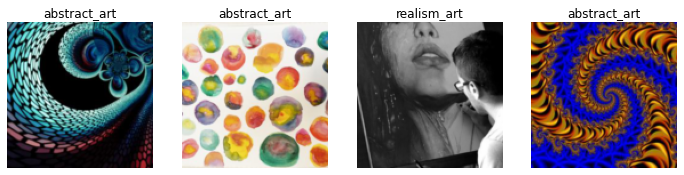

In [26]:
dls.valid.show_batch(max_n=4, nrows=1)

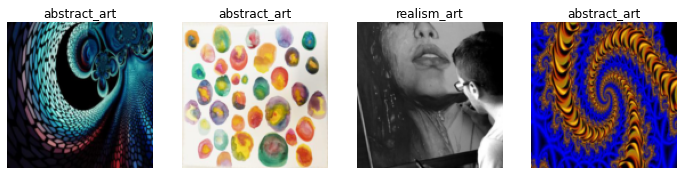

In [27]:
art = art.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = art.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

In [28]:
art = art.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = art.dataloaders(path)

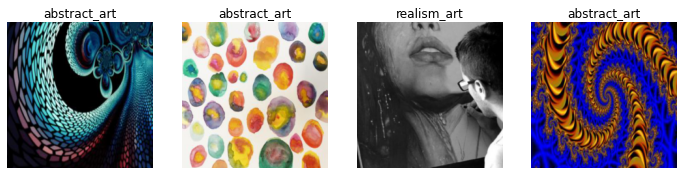

In [29]:
dls.valid.show_batch(max_n=4, nrows=1)

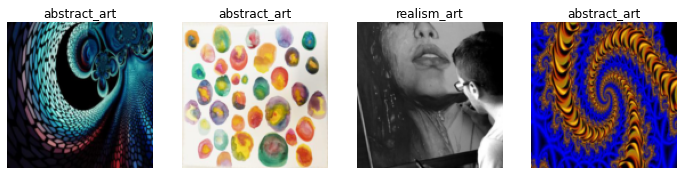

In [30]:
art = art.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = art.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

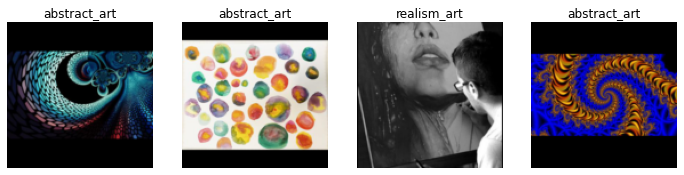

In [31]:
art = art.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = art.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

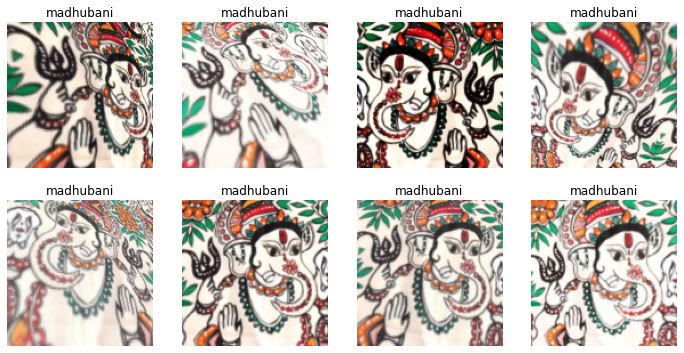

In [32]:
art = art.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = art.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [33]:
art = art.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = art.dataloaders(path)

In [34]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.7/dist-packages/fastai/vision/learner.py:265: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.465109,1.151994,0.293103,00:03


epoch,train_loss,valid_loss,error_rate,time
0,0.482351,0.510416,0.172414,00:03
1,0.360544,0.324814,0.120690,00:03
2,0.269755,0.339756,0.103448,00:03
3,0.224149,0.337866,0.112069,00:03


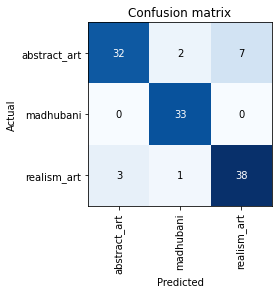

In [35]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

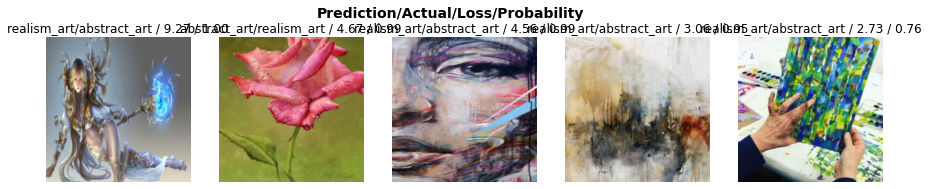

In [36]:
interp.plot_top_losses(5, nrows=1)

In [37]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [38]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

In [39]:
#hide
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [40]:
learn.export()

In [41]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [42]:
learn_inf = load_learner(path/'export.pkl')

In [43]:
!cp ./export.pkl ./gdrive/MyDrive/fastai/

In [44]:
learn_inf.predict(path/'image/abstract_art/00000000.jpg')

('abstract_art',
 TensorBase(0),
 TensorBase([9.9981e-01, 1.7870e-04, 1.4619e-05]))

In [45]:
learn_inf.dls.vocab

['abstract_art', 'madhubani', 'realism_art']

In [46]:
#hide_output
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [47]:
btn_upload = SimpleNamespace(data = [path/'image/abstract_art/00000000.jpg'])

In [48]:
btn_upload.data

[Path('image/abstract_art/00000000.jpg')]

In [49]:
img = PILImage.create(btn_upload.data[0])

In [50]:
#hide_output
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [51]:
pred,pred_idx,probs = learn_inf.predict(img)

In [52]:
#hide_output
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: abstract_art; Probability: 0.9998')

In [53]:
#hide_output
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [54]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [55]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [57]:
#hide_output
VBox([widgets.Label('Select your art!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

In [58]:
#hide
!pip install voila
!jupyter serverextension enable --sys-prefix voila 

     |████████████████████████████████| 1.7 MB 30.0 MB/s 
     |████████████████████████████████| 53 kB 2.8 MB/s 
     |████████████████████████████████| 130 kB 76.1 MB/s 
     |████████████████████████████████| 342 kB 72.7 MB/s 
     |████████████████████████████████| 112 kB 66.6 MB/s 
     |████████████████████████████████| 70 kB 11.2 MB/s 
     |████████████████████████████████| 561 kB 36.2 MB/s 
     |████████████████████████████████| 428 kB 72.8 MB/s 
     |████████████████████████████████| 54 kB 3.6 MB/s 
     |████████████████████████████████| 133 kB 70.1 MB/s 
  Created wheel for json5: filename=json5-0.9.8-py2.py3-none-any.whl size=18604 sha256=fb2ace84dca55671ae8b06a43896862840649beb63eb0a347baf68603e3b8f14
  Stored in directory: /root/.cache/pip/wheels/ac/9b/de/6e4fd8f159d3dfa42c42ceddf2184fda29ea7fb1e8f5f8371c
Successfully built json5
  Attempting uninstall: tornado
    Found existing installation: tornado 5.1.1
    Uninstalling tornado-5.1.1:
      Successfully uninstalled

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
      voila  OK
